# content channeling visualization labbook (PCA, MDS, imagesets galore...)

In [2]:
import numpy as np
import os
from os.path import isfile, join, exists
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from mpl_toolkits import mplot3d
%matplotlib inline

from IPython.core.debugger import set_trace
from tqdm import tqdm

from sklearn.manifold import MDS
from sklearn.decomposition import PCA as PCA
from sklearn.decomposition import IncrementalPCA
import time

import importlib
import nnutils as utils
import rsatools as rsa

importlib.reload(utils)
importlib.reload(rsa)

<module 'rsatools' from '/home/jacobpri/git/RotspaceIT/notebooks/rsatools.py'>

In [3]:
# idea: 
# (1) PCA on activation matrices from each layer (240 img set X nPCs)
# (2) RDM from the PC matrices for a given layer (240 x 240 per layer, vectorized)
# (3) uber RDM over the PC RDMs (240*20 layers x 240*20 layers) = 4800 x 4800
# (4) MDS over the uber RDM (4800,2)
# (4) each IMAGE gets its own line in the scatter plot... 

# for i = range(240):
    # indices = range(i,4800,240)
    # subMDS = MDS(indices,:)
    # plot(subMDS(:,0), subMDS(:,1)) -> colored by category

In [4]:
def PCA_MDS_experiment(layers_to_include, img_domains, nPCs, linewidths, drawplots = True):
    
    seed = 0
    activation_savedir = '/home/jacobpri/git/RotspaceIT/data/d02_modeling/activations/alexnet-object/experimental/mc8-shined/dim224/'

    layers = list(np.load(join(activation_savedir, 'lay_names_user_fmt_batchsize-240.npy')))
    
    layer_PCs = []
    layer_PC_rdms = []
    incl_idx = []
    
    # STEP 1: get indices of images to include in analysis
    for dom in img_domains:
        incl_idx.append(range(30*dom, 30*dom+30))
    incl_idx = np.concatenate(incl_idx)

    # STEP 2: run PCA on saved activation matrices
    for layer in tqdm(layers):
        
        flag = False
        for lay_ in layers_to_include:
            if lay_ in layer:
                flag = True

        if flag is True: 
            
            X = utils.load_batched_activations(activation_savedir, layer, batch_size=240, reshape_to_2D = True)
            X = X[incl_idx]
            pca = PCA(n_components=nPCs,random_state=seed)
            X_PCs = pca.fit_transform(X)

            layer_PCs.append(X_PCs) # save the PCs
            
    Y = np.vstack(layer_PCs)

    # STEP 3: create an RDM over the matrix of all PCs from all imgs/layers 
    uberRDM = rsa.rdm(Y)

    if drawplots is True:
        plt.figure(figsize=(12,8))
        plt.subplot(121)
        plt.imshow(Y,aspect='auto')
        plt.clim([-100,100])
        plt.colorbar()
        plt.title('PCs from all imgs/layers')
        plt.subplot(122)
        plt.imshow(uberRDM)
        plt.colorbar()
        plt.title('uberRDM over all img/layer PCs')

    # STEP 4: perform MDS 
    mds = MDS(n_components=2,dissimilarity='precomputed',random_state=seed)
    mds_coords = mds.fit_transform(uberRDM)
    
    # STEP 5: plot trajectories
    
    if drawplots is True:

        categ_colors = np.array([[0.988235294117647, 0.172549019607843, 0.345098039215686],
        [0.988235294117647, 0.305882352941177, 0.670588235294118],
        [0.658823529411765, 0.262745098039216, 0.984313725490196],
        [0.219607843137255, 0.188235294117647, 0.980392156862745],
        [0.423529411764706, 0.666666666666667, 0.988235294117647],
        [0.184313725490196, 0.901960784313726, 1],
        [0.992156862745098, 0.576470588235294, 0.149019607843137],
        [0.996078431372549, 0.909803921568627, 0.227450980392157]])

        categ_colors = categ_colors[np.array(img_domains)]
        
        nimg = X.shape[0]

        fig,a = plt.subplots(figsize=(15,15))
        lwidths = linewidths 
        for i in range(0,nimg,1):
            indices = np.arange(i,mds_coords.shape[0],nimg)
            subset = mds_coords[indices,:]

            plt.scatter(subset[0,0], subset[0,1], 60, c=categ_colors[int(i/30)].reshape(1,3))
            plt.scatter(subset[-1,0], subset[-1,1], 240, c=categ_colors[int(i/30)].reshape(1,3))

            points = np.array([subset[:,0], subset[:,1]]).T.reshape(-1, 1, 2)
            segments = np.concatenate([points[:-1], points[1:]], axis=1)
            lc = LineCollection(segments, linewidths=lwidths,color=categ_colors[int(i/30)],alpha=0.3)
            a.add_collection(lc)
            a.set_xlim(-1,1)
            a.set_ylim(-1,1)

        fig.show()
    
    return mds_coords

# faces, buildings, hammers... only including every other conv layer

100%|██████████| 21/21 [00:04<00:00,  4.42it/s]


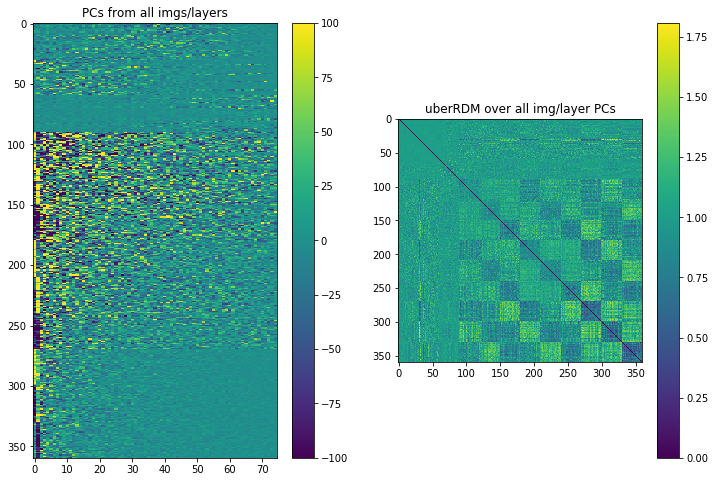

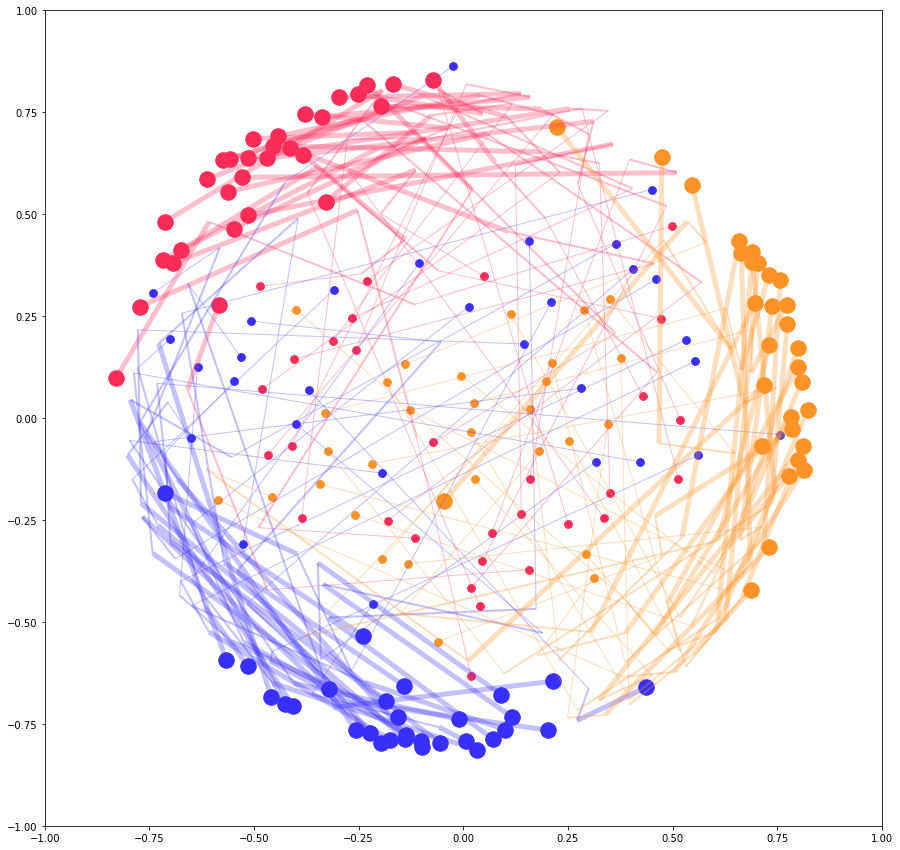

In [4]:
_ = PCA_MDS_experiment(layers_to_include = ['conv1','conv3','conv5','fc7'], 
                   img_domains = [0,3,6], 
                   nPCs = 75, 
                   linewidths = [1,2,5,8])

# faces, buildings, hammers... only including every other relu layer

100%|██████████| 21/21 [00:04<00:00,  4.47it/s]


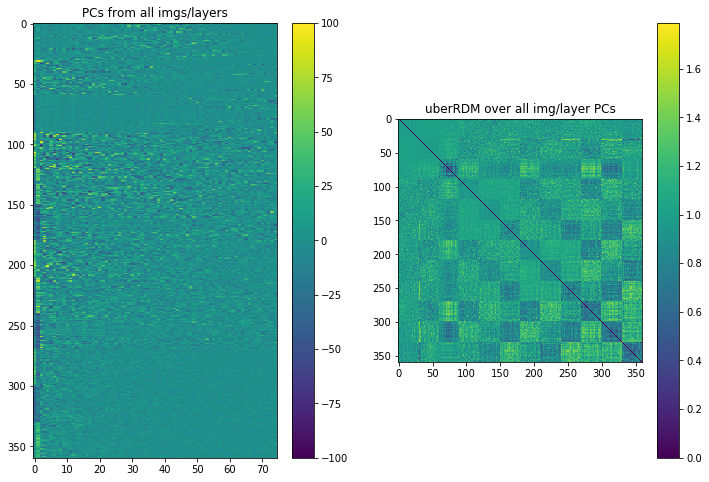

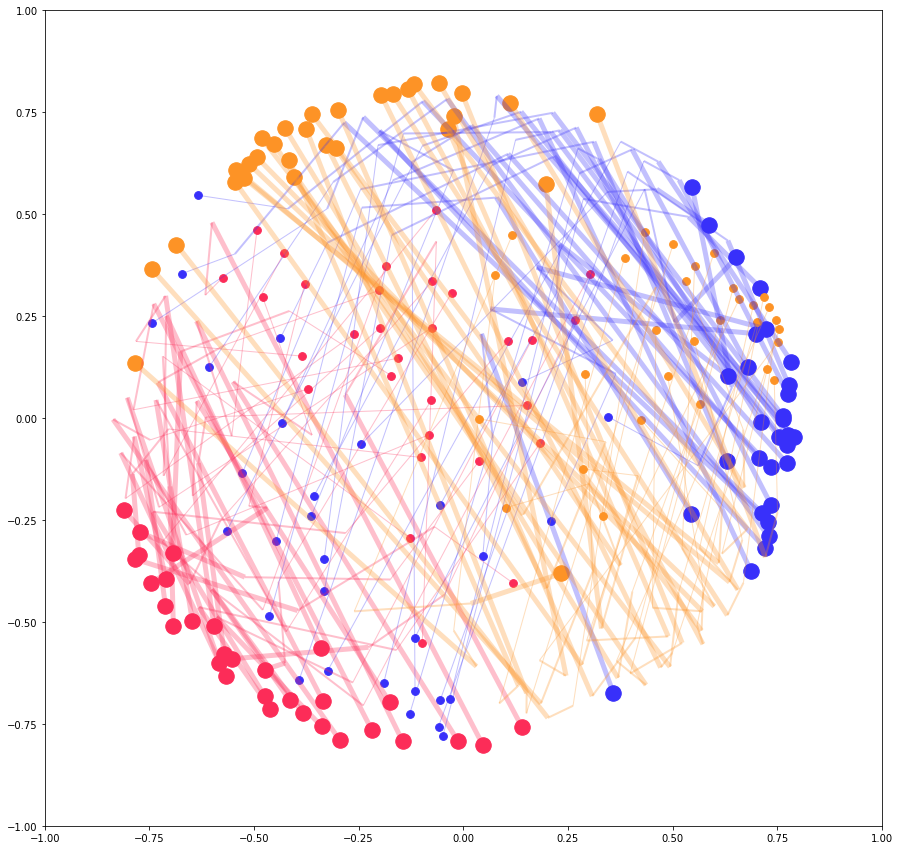

In [5]:
_ = PCA_MDS_experiment(layers_to_include = ['relu1','relu3','relu5','relu7'], 
                   img_domains = [0,3,6], 
                   nPCs = 75, 
                   linewidths = [1,2,5,8])

# faces, buildings, hammers... including all relus

100%|██████████| 21/21 [00:07<00:00,  2.78it/s]


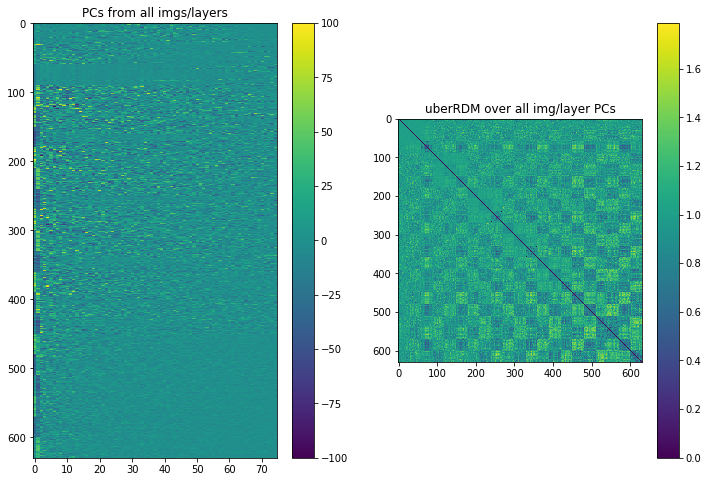

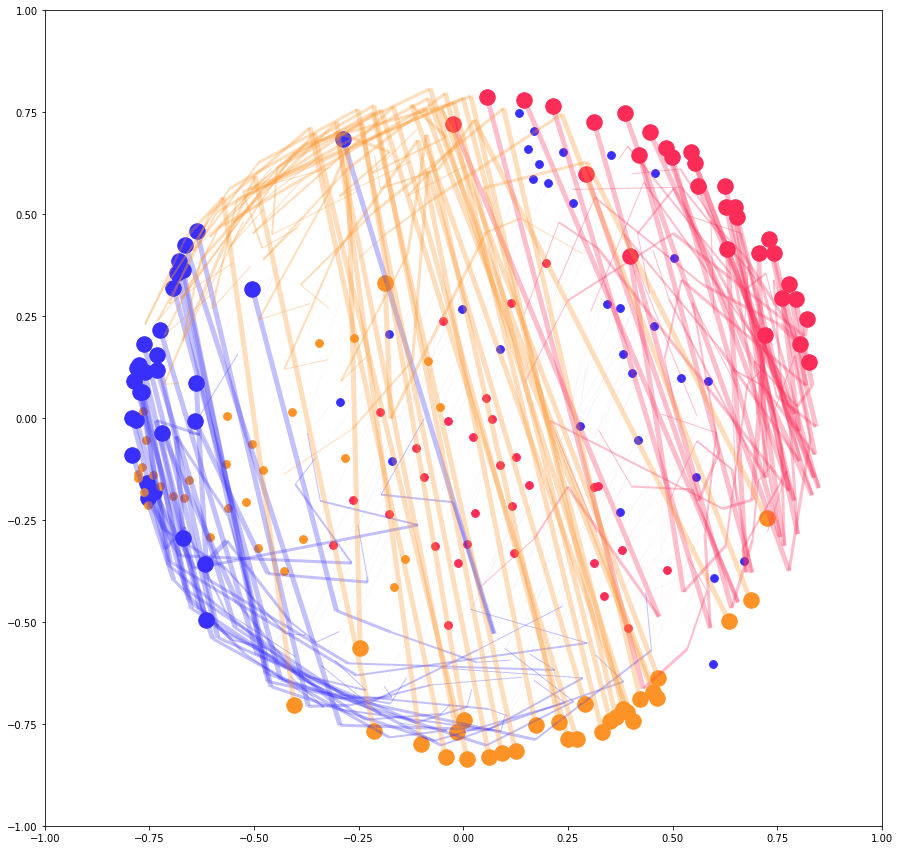

In [6]:
_ = PCA_MDS_experiment(layers_to_include = ['relu1','relu2','relu3','relu4','relu5','relu6','relu7'], 
                   img_domains = [0,3,6], 
                   nPCs = 75, 
                   linewidths = [0.01, 0.1, 1, 2, 3, 5, 8])

# all categories, every other relu

100%|██████████| 21/21 [00:05<00:00,  3.54it/s]


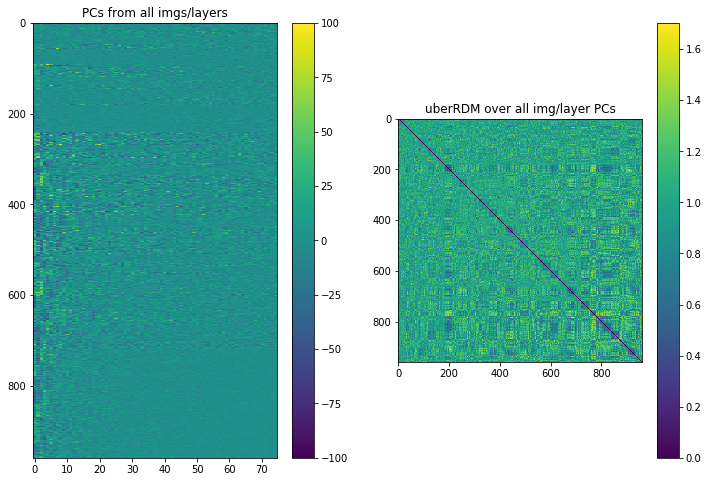

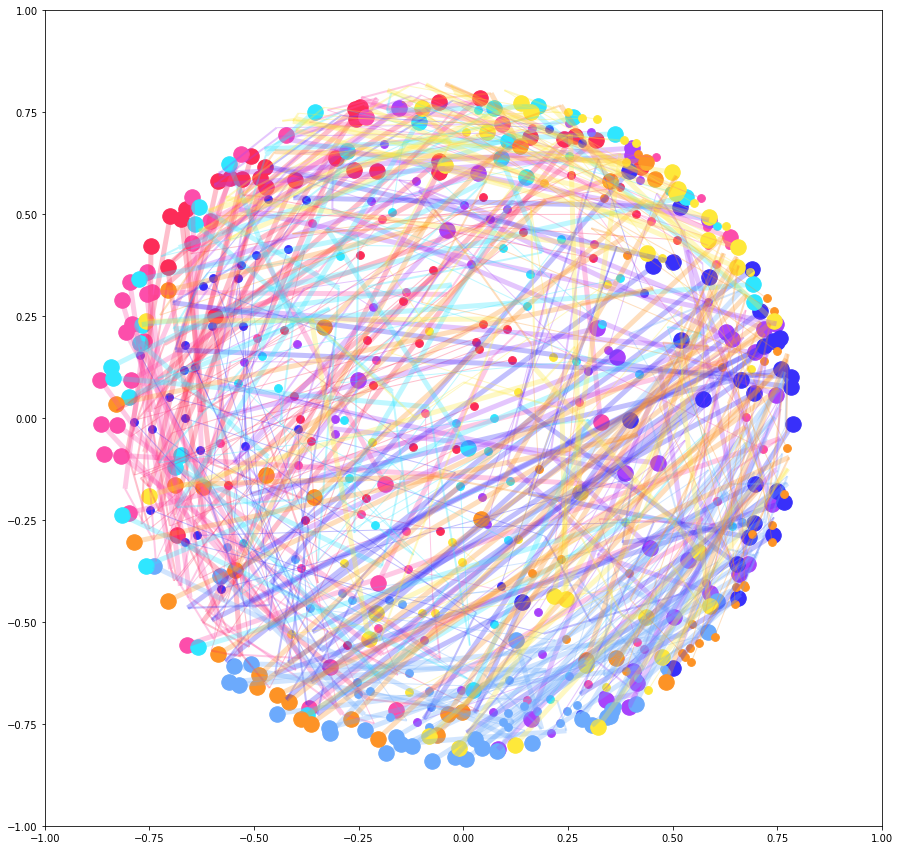

In [7]:
_ = coords = PCA_MDS_experiment(layers_to_include = ['relu1','relu3','relu5','relu7'], 
                   img_domains = [0,1,2,3,4,5,6,7], 
                   nPCs = 75, 
                   linewidths = [1, 2, 5, 8])

100%|██████████| 21/21 [00:01<00:00, 11.19it/s]


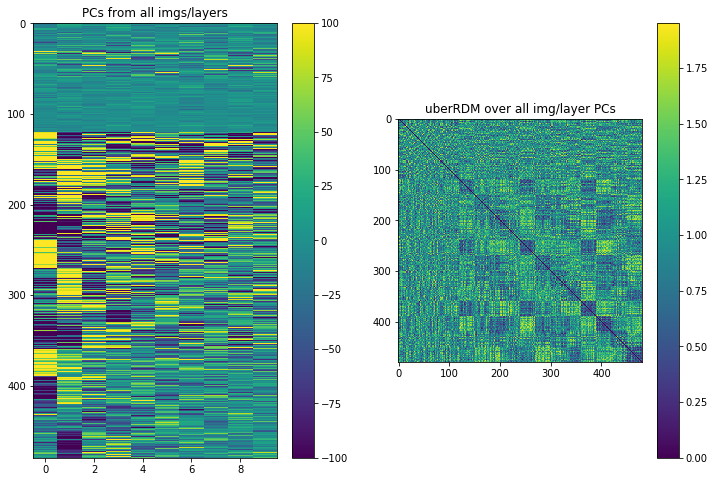

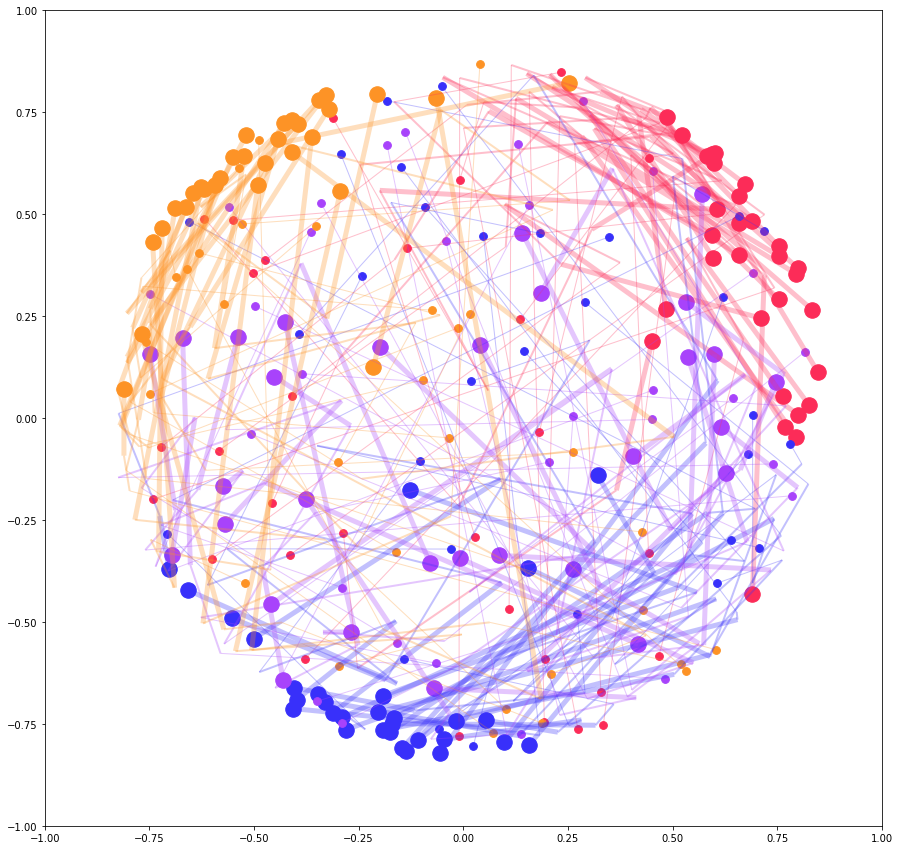

In [8]:
layers_to_include = ['conv1','conv3','conv5','fc7']
img_domains = [0,3,2,6]
nPCs = 10
linewidths = [1, 2, 5, 8]

mds_coords = PCA_MDS_experiment(layers_to_include, 
                   img_domains, 
                   nPCs, 
                   linewidths,
                   drawplots = True)



# ok... we need to raise this into 3d!

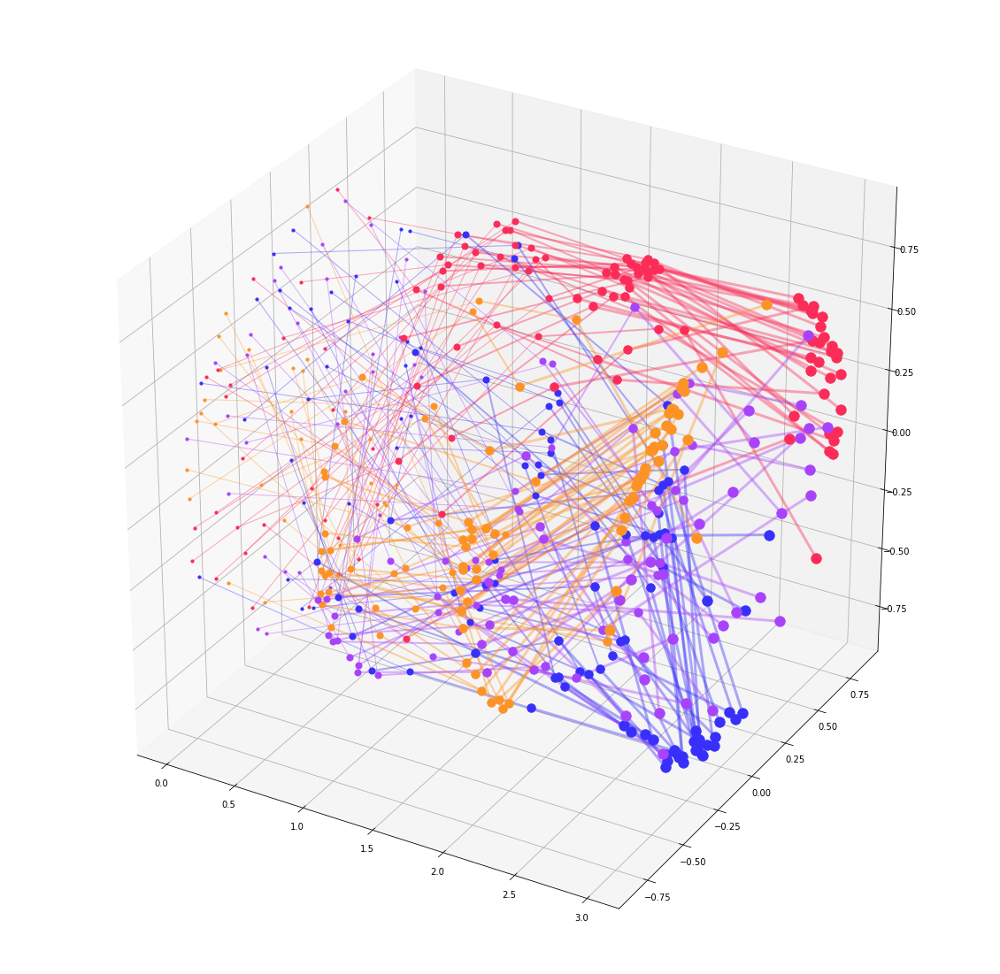

In [9]:

categ_colors = np.array([[0.988235294117647, 0.172549019607843, 0.345098039215686],
[0.988235294117647, 0.305882352941177, 0.670588235294118],
[0.658823529411765, 0.262745098039216, 0.984313725490196],
[0.219607843137255, 0.188235294117647, 0.980392156862745],
[0.423529411764706, 0.666666666666667, 0.988235294117647],
[0.184313725490196, 0.901960784313726, 1],
[0.992156862745098, 0.576470588235294, 0.149019607843137],
[0.996078431372549, 0.909803921568627, 0.227450980392157]])

categ_colors = categ_colors[np.array(img_domains)]
nimg = 30*len(img_domains)

fig = plt.subplots(figsize=(20,20))
a = plt.axes(projection="3d")

linewidths = [1, 2, 3, 4]

for i in range(nimg):
    indices = np.arange(i,mds_coords.shape[0],nimg)
    subset = mds_coords[indices,:]
    
    # every layer gets its own x coordinate
    for j in range(subset.shape[0]):
        
        # plot dots
        a.scatter3D(j, subset[j,0], subset[j,1], c=categ_colors[int(i/30)].reshape(1,3), s=40*j+10)
        
        if j < subset.shape[0]-1:
            
            # plot connecting lines
            a.plot3D([j, j+1], [subset[j,0], subset[j+1,0]], [subset[j,1], subset[j+1,1]],
                    color=categ_colors[int(i/30)],alpha=0.4,linewidth=linewidths[j])
            

## how to project a matrix into the PC space of another matrix?

In [10]:
# example of small image set with data from 20 units
x1 = np.random.normal(0,1,(50,20))

# example of larger image set with data from same # units
x2 = np.random.normal(0,1,(500,20))

# first, fit the model on the large image set
pca = PCA(n_components=10)
pca.fit(x2)

# data from the small image set can easily be projected into the PC space of the large image set
print(pca.transform(x2).shape)
print(pca.transform(x1).shape)

# simple!


(500, 10)
(50, 10)


In [ ]:
# some simulations to learn about the incremental PCA method in sklearn

times = []
times2 = []
errs = []
nimg = 5000
for units in [200000]:#, 25000, 50000]:
    
    X = np.random.normal(0,1,(nimg,units))
    n_components = 100
    t1 = time.time()
    ipca = IncrementalPCA(n_components=n_components, batch_size=100)
    ipca.fit(X)
    t2 = time.time()
    times.append(t2-t1)
    print(t2-t1)
#     t3 = time.time()
#     pca = PCA(n_components=n_components)
#     pca.fit(X)
#     t4 = time.time()
#     times2.append(t4-t3)
#     print(t4-t3)
    
    
    #X_ipca = ipca.fit_transform(X)
    

In [ ]:
plt.plot([1000, 5000, 10000],times)
plt.plot([1000, 5000, 10000],times2)

# MDS with animacy/size/texform stimuli: where do faces and buildings situate?

In [11]:
layers0 = np.load('/home/jacobpri/git/RotspaceIT/data/d02_modeling/activations/alexnet-object/experimental/mc8-lummatched/dim224/lay_names_user_fmt_batchsize-240.npy')

layers = [layer.split('_')[1:][0] for layer in layers0]
print(layers)

['conv1', 'relu1', 'maxpool1', 'conv2', 'relu2', 'maxpool2', 'conv3', 'relu3', 'conv4', 'relu4', 'conv5', 'relu5', 'maxpool5', 'avgpool5', 'drop5', 'fc6', 'relu6', 'drop6', 'fc7', 'relu7', 'fc8']


In [12]:
def anim_size_texform_mds(mode, incl_layers,figsize=(50,8),dotsize=100):
    
    rdm_dir = '/home/jacobpri/git/RotspaceIT/data/d02_modeling/rdvs/alexnet-object/experimental/anim-size-texform/dim224/'

    fns = np.load(join(rdm_dir,'absolute_rdv_filepaths_batchsize-40.npy'))

    if mode == 'only_texforms':
        incl_idx = np.arange(180,300)
        categs = ['tf-big-animals','tf-big-objects','tf-small-animals','tf-small-objects']
        colors = np.repeat(['plum','lightskyblue','plum','navajowhite'],30)

    elif mode == 'only_originals':
        incl_idx = np.arange(60,180)
        categs = ['big-animals','big-objects','small-animals','small-objects']
        colors = np.repeat(['mediumorchid','dodgerblue','mediumorchid','orange'],30)
        
    elif mode == 'texforms_and_originals':
        incl_idx = np.arange(60,300)
        categs = ['big-animals','big-objects','small-animals','small-objects','tf-big-animals','tf-big-objects','tf-small-animals','tf-small-objects']
        colors = np.repeat(['mediumorchid','dodgerblue','mediumorchid','orange','plum','lightskyblue','plum','navajowhite'],30)

    elif mode == 'texforms_with_mc':
        incl_idx = np.concatenate((np.arange(0,60), np.arange(180,300)))
        categs = ['faces','buildings','tf-big-animals','tf-big-objects','tf-small-animals','tf-small-objects']
        colors = np.repeat(['red','limegreen','plum','lightskyblue','plum','navajowhite'],30)

    elif mode == 'originals_with_mc':
        incl_idx = np.arange(0,180)
        categs = ['faces','buildings','big-animals','big-objects','small-animals','small-objects']
        colors = np.repeat(['red','limegreen','mediumorchid','dodgerblue','mediumorchid','orange'],30)

    elif mode == 'all':
        incl_idx = np.arange(0,300)
        categs = ['faces','buildings','big-animals','big-objects','small-animals','small-objects','tf-big-animals','tf-big-objects','tf-small-animals','tf-small-objects']
        colors = np.repeat(['red','limegreen','mediumorchid','dodgerblue','mediumorchid','orange','plum','lightskyblue','plum','navajowhite'],30)
                           
    layer_rdms = []
    layers = []
    for fn in fns:

        rdm = rsa.v2m(np.load(fn))
        layer_rdms.append(rsa.subsample_dm(rdm, incl_idx))

        layers.append(fn.split('_')[2])
                
    n = len(incl_layers)
    seed = 365

    plt.figure(figsize=figsize)

    c = 1
    for i in range(len(layers)):
        if layers[i] in incl_layers:
            rdm = layer_rdms[i]

            mds = MDS(n_components=2,dissimilarity='precomputed',random_state=seed)
            mds_coords = mds.fit_transform(rdm)

            if len(incl_layers) > 1:
                plt.subplot(1,n,c)
            plt.scatter(mds_coords[:,0],mds_coords[:,1],dotsize,color=colors)
            plt.axis('square')
            plt.title(layers[i],fontsize=24)
            plt.axis('off')
            plt.xlim([-1, 1])
            plt.ylim([-1, 1])
            c+=1
    plt.show()
    
            

# just big objects (blue), small objects (orange), animals (purple)
## ...with and without texforms (lighter colors)
## ...conv and fc layers only

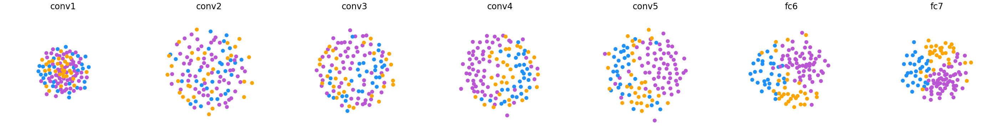

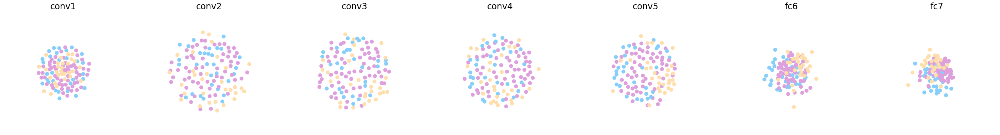

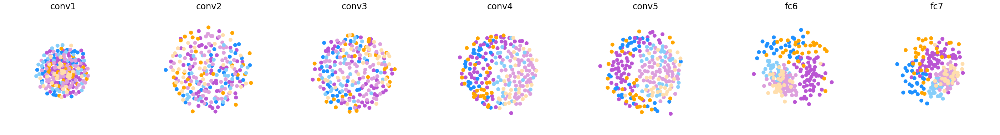

In [13]:
incl_layers = [layer for layer in layers if 'conv' in layer or 'fc' in layer][:-1]
anim_size_texform_mds('only_originals',incl_layers)
anim_size_texform_mds('only_texforms',incl_layers)
anim_size_texform_mds('texforms_and_originals',incl_layers)

    

# just big objects (blue), small objects (orange), animals (purple)
## ...with and without texforms
## ...NOW, relu layers only

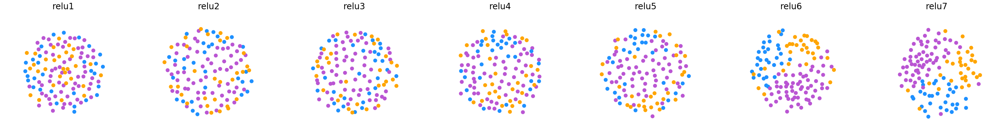

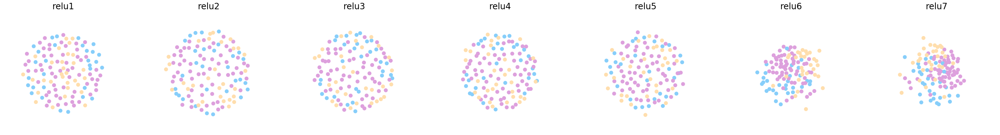

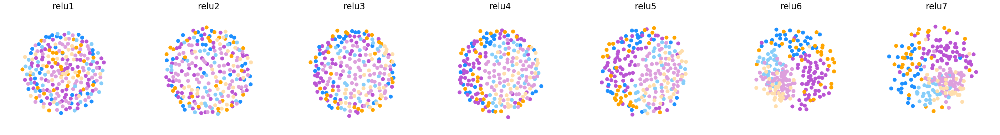

In [14]:
incl_layers = [layer for layer in layers if 'relu' in layer]
anim_size_texform_mds('only_originals',incl_layers)
anim_size_texform_mds('only_texforms',incl_layers)
anim_size_texform_mds('texforms_and_originals',incl_layers)


# mc8-faces (red), mc8-buildings (green), big objects (blue), small objects (orange), animals (purple)
## ...with and without texforms
## ...conv and fc layers only

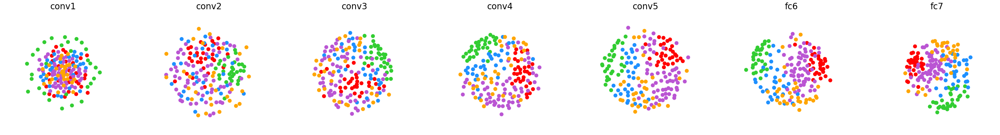

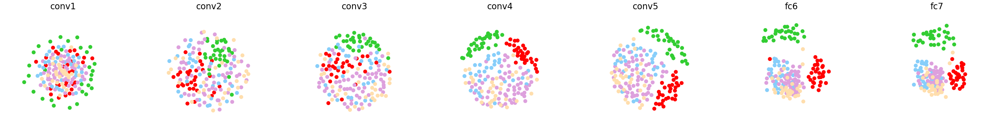

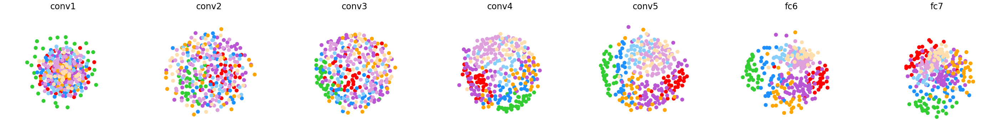

In [15]:
incl_layers = [layer for layer in layers if 'conv' in layer or 'fc' in layer][:-1]
anim_size_texform_mds('originals_with_mc',incl_layers)
anim_size_texform_mds('texforms_with_mc',incl_layers)
anim_size_texform_mds('all',incl_layers)


# mc8-faces (red), mc8-buildings (green), big objects (blue), small objects (orange), animals (purple)
## ...with and without texforms
## ...NOW, relu layers only

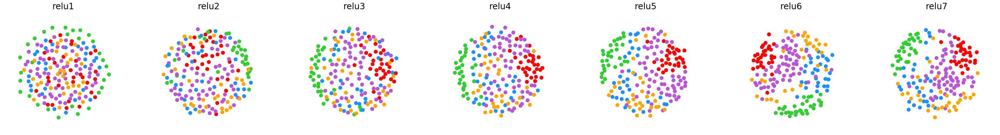

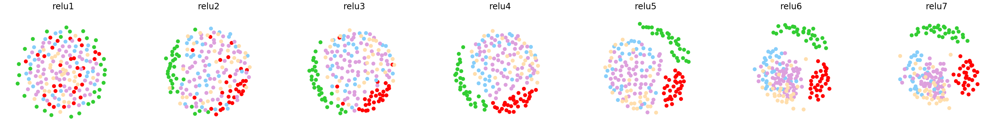

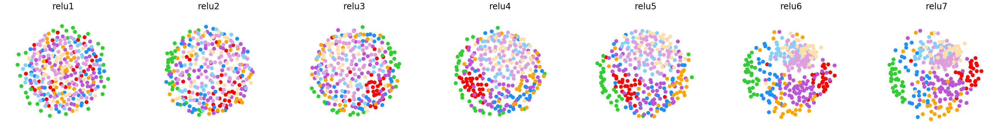

In [16]:
incl_layers = [layer for layer in layers if 'relu' in layer]
anim_size_texform_mds('originals_with_mc',incl_layers)
anim_size_texform_mds('texforms_with_mc',incl_layers)
anim_size_texform_mds('all',incl_layers)

# some layers of interest...

## conv5, showing relative closeness of faces to animals and buildings to large objects...

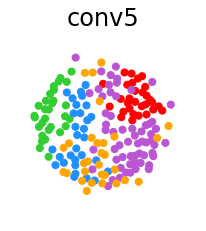

In [17]:
incl_layers = [layer for layer in layers if 'conv' in layer or 'fc' in layer][:-1][4]
anim_size_texform_mds('originals_with_mc',incl_layers,figsize=(20,20),dotsize=50)

## fc7, showing relative closeness of faces to animals and buildings to large objects...

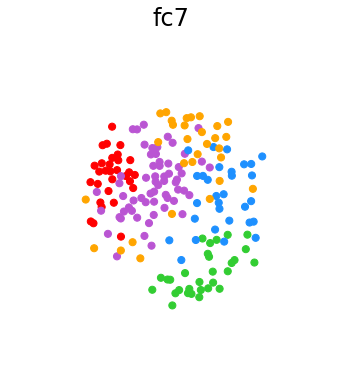

In [18]:
incl_layers = [layer for layer in layers if 'conv' in layer or 'fc' in layer][:-1][-1]
anim_size_texform_mds('originals_with_mc',incl_layers,figsize=(20,20),dotsize=50)

## relu6, layer containing integrated face area

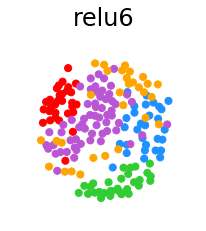

In [19]:
incl_layers = [layer for layer in layers if 'relu' in layer][5]
anim_size_texform_mds('originals_with_mc',incl_layers,figsize=(20,20),dotsize=50)

## relu7, layer containing integrated scene area

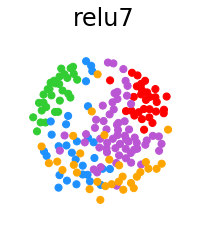

In [20]:
incl_layers = [layer for layer in layers if 'relu' in layer][6]
anim_size_texform_mds('originals_with_mc',incl_layers,figsize=(20,20),dotsize=50)

## conv5, with all images (including texforms)

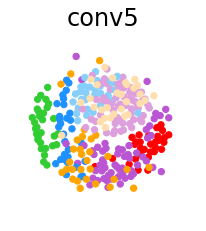

In [21]:
incl_layers = [layer for layer in layers if 'conv' in layer][4]
anim_size_texform_mds('all',incl_layers,figsize=(20,20),dotsize=40)

... this is actually kinda cool... faces are solidly within the animal cluster; buildings are nearest to the big object cluster; there seem to be reasonable size and animacy gradients going left to right, and though the texforms are situated within their own cluster (e.g. more similar to each other than to non-texform variants), the orientation of the domains within the texform cluster basically mirrors the **big object -> small object -> animal** gradient of the broader MDS. 

In [22]:
# let's try PCA instead of MDS

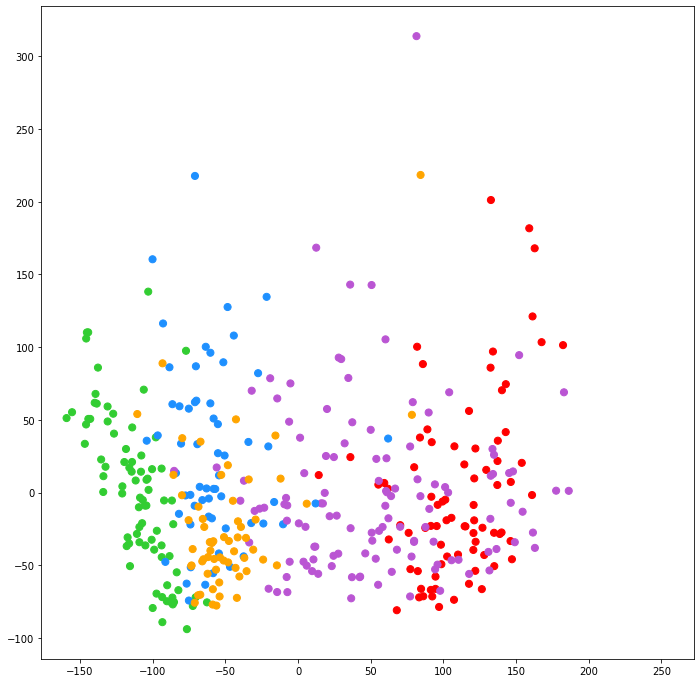

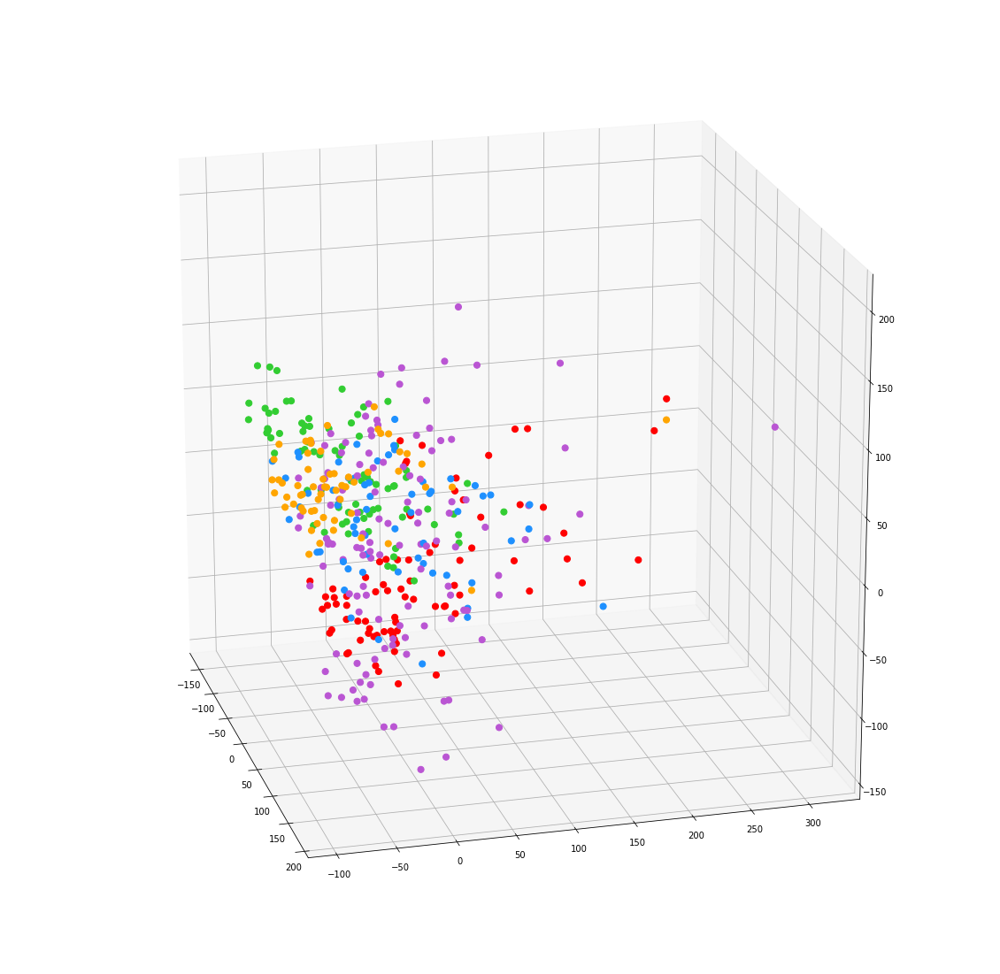

In [68]:
nimg = 80
categs = ['faces','buildings',]#'big-animals','big-objects','small-animals','small-objects']
colors = np.repeat(['red','limegreen'],nimg)#,'mediumorchid','dodgerblue','mediumorchid','orange'],nimg)

seed = 0
nPCs = 50

layer = 'maxpool5' #list(np.load(join(activation_savedir, 'lay_names_user_fmt_batchsize-240.npy')))

all_colors = []
data = []

#########
activation_savedir = '/home/jacobpri/git/RotspaceIT/data/d02_modeling/activations/alexnet-object/localizer/imagefiles-fullset/dim224/'
colors = np.repeat(['red','limegreen'],nimg)#,'mediumorchid','dodgerblue','mediumorchid','orange'],nimg)
incl_idx = []
img_domains = [1,3]#[0, 1, 2, 3, 4, 5]

for dom in img_domains:
    incl_idx.append(range(nimg*dom, nimg*dom+nimg))
incl_idx = np.concatenate(incl_idx)

# STEP 2: run PCA on saved activation matrices

X = utils.load_batched_activations(activation_savedir, layer, batch_size=100, reshape_to_2D = True)
X = X[incl_idx]
pca = PCA(n_components=nPCs,random_state=seed)
X_PCs = pca.fit_transform(X)

data.append(X_PCs)
all_colors.append(colors)

#########
nimg = 60
activation_savedir = '/home/jacobpri/git/RotspaceIT/data/d02_modeling/activations/alexnet-object/experimental/anim-size-color/dim224/'
colors = np.repeat(['mediumorchid','dodgerblue','mediumorchid','orange'],nimg)

incl_idx = []
img_domains = [0,1,2,3]

for dom in img_domains:
    incl_idx.append(range(nimg*dom, nimg*dom+nimg))
incl_idx = np.concatenate(incl_idx)

# STEP 2: run PCA on saved activation matrices

X = utils.load_batched_activations(activation_savedir, layer, batch_size=40, reshape_to_2D = True)
X = X[incl_idx]
pca = PCA(n_components=nPCs,random_state=seed)
X_PCs = pca.fit_transform(X)

data.append(X_PCs)
all_colors.append(colors)

##########

data = np.vstack(data)
all_colors = np.concatenate(all_colors)

# plt.imshow(data,aspect='auto')
# print(data.shape)

plt.figure(figsize=(12,12))
plt.scatter(data[:,0],data[:,1],50,color=all_colors)
plt.axis('square')


fig = plt.subplots(figsize=(20,20))
a = plt.axes(projection="3d")

# plot dots
a.scatter3D(data[:,0],data[:,1],data[:,2],c=all_colors,s=50,alpha=1)
for ii in np.arange(0,360,15):
    a.view_init(elev=20., azim=ii)
    plt.savefig("movie%d.png" % ii)


In [ ]:
plt.figure(figsize=figsize)

c = 1
for i in range(len(layers)):
    if layers[i] in incl_layers:
        rdm = layer_rdms[i]

        #mds = MDS(n_components=2,dissimilarity='precomputed',random_state=seed)
        #mds_coords = mds.fit_transform(rdm)
        
        PCA = 

        if len(incl_layers) > 1:
            plt.subplot(1,n,c)
        plt.scatter(mds_coords[:,0],mds_coords[:,1],dotsize,color=colors)
        plt.axis('square')
        plt.title(layers[i],fontsize=24)
        plt.axis('off')
        plt.xlim([-1, 1])
        plt.ylim([-1, 1])
        c+=1
plt.show()